# Crime EDA, clustering and prediction

## Import Dataset

In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("haseefalam/crime-dataset")

print("Path to dataset files:", path)

/usr/local/lib/python3.10/dist-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Path to dataset files: /root/.cache/kagglehub/datasets/haseefalam/crime-dataset/versions/1


## Import dependencies

In [2]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import folium
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler
from skforecast.ForecasterAutoreg import ForecasterAutoreg
from lightgbm import LGBMRegressor

## Read Dataset

In [3]:
df = pd.read_csv(path + "/Crime_Data_from_2020_to_Present.csv")
df.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,190326475,03/01/2020 12:00:00 AM,03/01/2020 12:00:00 AM,2130,7,Wilshire,784,1,510,VEHICLE - STOLEN,...,AA,Adult Arrest,510.0,998.0,NaN,NaN,1900 S LONGWOOD AV,NaN,34.0375,-118.3506
1,200106753,02/09/2020 12:00:00 AM,02/08/2020 12:00:00 AM,1800,1,Central,182,1,330,BURGLARY FROM VEHICLE,...,IC,Invest Cont,330.0,998.0,NaN,NaN,1000 S FLOWER ST,NaN,34.0444,-118.2628
2,200320258,11/11/2020 12:00:00 AM,11/04/2020 12:00:00 AM,1700,3,Southwest,356,1,480,BIKE - STOLEN,...,IC,Invest Cont,480.0,NaN,NaN,NaN,1400 W 37TH ST,NaN,34.0210,-118.3002
3,200907217,05/10/2023 12:00:00 AM,03/10/2020 12:00:00 AM,2037,9,Van Nuys,964,1,343,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),...,IC,Invest Cont,343.0,NaN,NaN,NaN,14000 RIVERSIDE DR,NaN,34.1576,-118.4387
4,220614831,08/18/2022 12:00:00 AM,08/17/2020 12:00:00 AM,1200,6,Hollywood,666,2,354,THEFT OF IDENTITY,...,IC,Invest Cont,354.0,NaN,NaN,NaN,1900 TRANSIENT,NaN,34.0944,-118.3277


Change column types of dates

In [4]:
df['Date Rptd'] = pd.to_datetime(df['Date Rptd'])
df['DATE OCC'] = pd.to_datetime(df['DATE OCC'])
df.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,190326475,2020-03-01,2020-03-01,2130,7,Wilshire,784,1,510,VEHICLE - STOLEN,...,AA,Adult Arrest,510.0,998.0,NaN,NaN,1900 S LONGWOOD AV,NaN,34.0375,-118.3506
1,200106753,2020-02-09,2020-02-08,1800,1,Central,182,1,330,BURGLARY FROM VEHICLE,...,IC,Invest Cont,330.0,998.0,NaN,NaN,1000 S FLOWER ST,NaN,34.0444,-118.2628
2,200320258,2020-11-11,2020-11-04,1700,3,Southwest,356,1,480,BIKE - STOLEN,...,IC,Invest Cont,480.0,NaN,NaN,NaN,1400 W 37TH ST,NaN,34.0210,-118.3002
3,200907217,2023-05-10,2020-03-10,2037,9,Van Nuys,964,1,343,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),...,IC,Invest Cont,343.0,NaN,NaN,NaN,14000 RIVERSIDE DR,NaN,34.1576,-118.4387
4,220614831,2022-08-18,2020-08-17,1200,6,Hollywood,666,2,354,THEFT OF IDENTITY,...,IC,Invest Cont,354.0,NaN,NaN,NaN,1900 TRANSIENT,NaN,34.0944,-118.3277


Value counts of Crm Cd Desc

In [5]:
df['Crm Cd Desc'].value_counts()

Crm Cd Desc
VEHICLE - STOLEN                                           104632
BATTERY - SIMPLE ASSAULT                                    74583
BURGLARY FROM VEHICLE                                       59155
THEFT OF IDENTITY                                           59054
VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)     57929
                                                            ...  
BLOCKING DOOR INDUCTION CENTER                                  6
FIREARMS EMERGENCY PROTECTIVE ORDER (FIREARMS EPO)              5
DISHONEST EMPLOYEE ATTEMPTED THEFT                              4
FIREARMS RESTRAINING ORDER (FIREARMS RO)                        4
TRAIN WRECKING                                                  1
Name: count, Length: 139, dtype: int64

# EDA

## Crimes density by latitude and longitude using a sample.

In [6]:
# Create a base map
m = folium.Map(location=[df['LAT'].mean(), df['LON'].mean()], zoom_start=10)

# Create a random sample of 200 rows from df
df_sample = df.sample(n=200, random_state=1)

# Add points to the map
for idx, row in df_sample.iterrows():
    folium.Marker(
        location=[row['LAT'], row['LON']],
        popup=row['Crm Cd Desc']
    ).add_to(m)

# Display the map
m

## Qty of crime by area

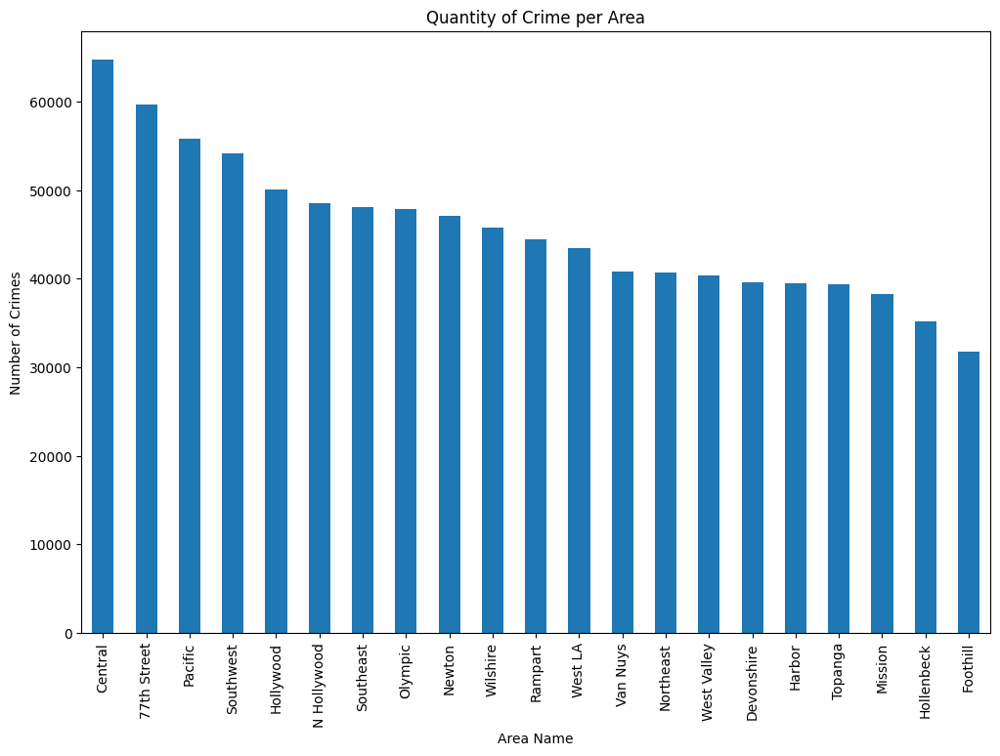

In [7]:


# Group by 'AREA NAME' and count the number of occurrences
crime_per_area = df['AREA NAME'].value_counts()

# Plot the data
plt.figure(figsize=(12, 8))
crime_per_area.plot(kind='bar')
plt.title('Quantity of Crime per Area')
plt.xlabel('Area Name')
plt.ylabel('Number of Crimes')
plt.xticks(rotation=90)
plt.show()

## Crime Trend over time

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


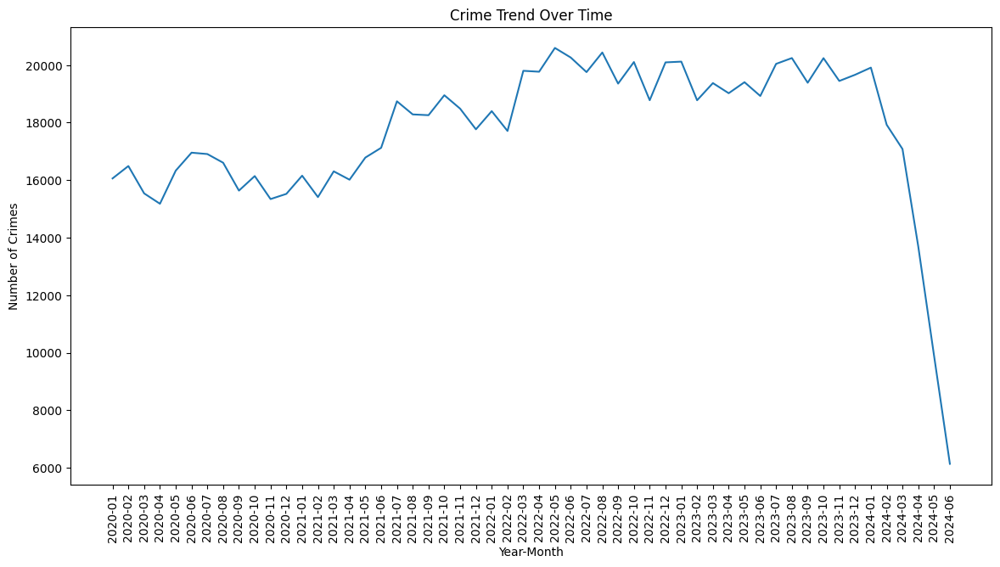

In [8]:
# Extract year and month from 'Date Rptd'
df['YearMonth'] = df['Date Rptd'].dt.to_period('M')

# Group by 'YearMonth' and count the number of occurrences
crime_trend = df['YearMonth'].value_counts().sort_index()

# Plot the data
plt.figure(figsize=(14, 7))
sns.lineplot(x=crime_trend.index.astype(str), y=crime_trend.values)
plt.title('Crime Trend Over Time')
plt.xlabel('Year-Month')
plt.ylabel('Number of Crimes')
plt.xticks(rotation=90)
plt.show()

## Top 20 reported crimes

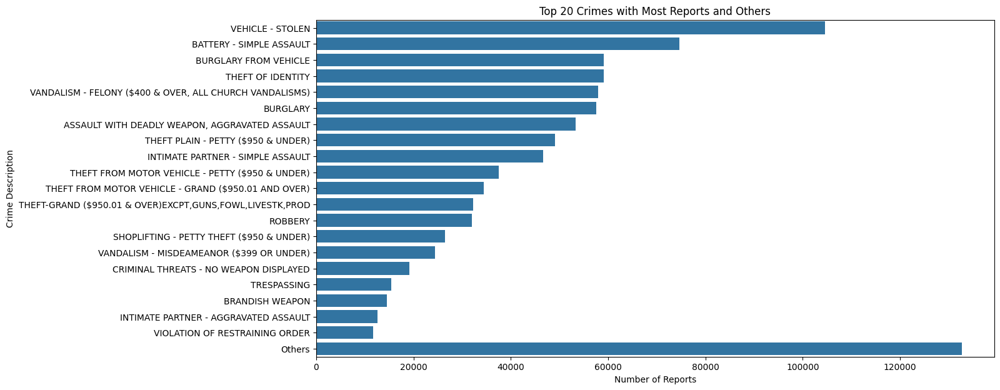

In [9]:

# Get the top 20 crimes
top_20_crimes = df['Crm Cd Desc'].value_counts().nlargest(20)

# Create a new column for plotting
df['Crm Cd Desc Plot'] = df['Crm Cd Desc'].apply(lambda x: x if x in top_20_crimes.index else 'Others')
# Ensure 'Others' appears at the end
df['Crm Cd Desc Plot'] = pd.Categorical(df['Crm Cd Desc Plot'], categories=list(top_20_crimes.index) + ['Others'], ordered=True)
# Plot the data
plt.figure(figsize=(14, 7))
sns.countplot(y='Crm Cd Desc Plot', data=df, order=list(top_20_crimes.index) + ['Others'])
plt.title('Top 20 Crimes with Most Reports and Others')
plt.xlabel('Number of Reports')
plt.ylabel('Crime Description')
plt.show()

# Clustering
Using a sample we will cluster the crimes by latitude, longitude and type of crime.

In [10]:
# Select a smaller sample of features for clustering
sample_df = df.sample(n=10000, random_state=1)
features = ['LAT', 'LON', 'Crm Cd']

# Standardize the features
scaler = StandardScaler()
sample_df_scaled = scaler.fit_transform(sample_df[features])

# Perform Agglomerative Clustering
agg_clustering = AgglomerativeClustering(n_clusters=20)
sample_df['Cluster'] = agg_clustering.fit_predict(sample_df_scaled)

# Display the first few rows to verify the new column
sample_df.head()


,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON,YearMonth,Crm Cd Desc Plot,Cluster
681659,231713184,2023-07-20,2023-07-12,2330,17,Devonshire,1764,1,331,THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND ...,...,NaN,NaN,NaN,9300 TAMPA AV,NaN,34.2440,-118.5583,2023-07,THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND ...,5
218293,210310188,2021-05-11,2021-05-02,1000,3,Southwest,331,1,440,THEFT PLAIN - PETTY ($950 & UNDER),...,NaN,NaN,NaN,JEFFERSON,LA BREA,34.0255,-118.3542,2021-05,THEFT PLAIN - PETTY ($950 & UNDER),8
376433,211314811,2021-08-24,2021-08-24,1720,13,Newton,1307,2,624,BATTERY - SIMPLE ASSAULT,...,NaN,NaN,NaN,700 S SAN PEDRO ST,NaN,34.0405,-118.2470,2021-08,BATTERY - SIMPLE ASSAULT,2
41991,201909040,2020-04-24,2020-04-21,1600,19,Mission,1908,2,624,BATTERY - SIMPLE ASSAULT,...,NaN,NaN,NaN,13400 ELDRIDGE AV,NaN,34.3154,-118.4214,2020-04,BATTERY - SIMPLE ASSAULT,17
628681,220817693,2022-12-05,2022-11-30,1552,8,West LA,889,1,442,SHOPLIFTING - PETTY THEFT ($950 & UNDER),...,NaN,NaN,NaN,1800 LA CIENEGA BL,NaN,34.0425,-118.3818,2022-12,SHOPLIFTING - PETTY THEFT ($950 & UNDER),8


## Plotting clusters in a map

In [11]:
# Create a base map centered around the mean latitude and longitude
map_clusters = folium.Map(location=[sample_df['LAT'].mean(), sample_df['LON'].mean()], zoom_start=10)

# Define a color palette for the clusters
colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 
          'cadetblue', 'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray', 'brown']

# Add points to the map
for idx, row in sample_df.iterrows():
    folium.CircleMarker(
        location=[row['LAT'], row['LON']],
        radius=5,
        color=colors[row['Cluster'] % len(colors)],
        fill=True,
        fill_color=colors[row['Cluster'] % len(colors)],
        fill_opacity=0.7,
        popup=f"Cluster: {row['Cluster']}\nCrime: {row['Crm Cd Desc']}"
    ).add_to(map_clusters)

# Display the map
map_clusters

# Prediction for next year

## Data Preparation

In [13]:
# Create a pivot table with the sum of each Crime Cd by Area by date
pivot_df = df.pivot_table(index='DATE OCC', columns=['AREA NAME', 'Crm Cd'], values='DR_NO', aggfunc='count', fill_value=0)

pivot_df = pivot_df.asfreq('D', method = 'bfill') # Fill missing values with the previous value

# Display the first few rows of the pivot table
pivot_df.head()



AREA NAME  77th Street                                      ... Wilshire      \
Crm Cd             110 113 121 122 210 220 230 231 235 236  ...      932 933   
DATE OCC                                                    ...                
2020-01-01           0   0   2   0   4   1   4   0   0   3  ...        0   0   
2020-01-02           0   0   0   0   4   0   6   0   0   0  ...        0   0   
2020-01-03           0   0   0   0   3   0   6   0   0   0  ...        0   0   
2020-01-04           0   0   1   0   1   0   1   0   0   0  ...        0   0   
2020-01-05           0   0   0   0   2   2   2   0   0   0  ...        0   0   

AREA NAME                                   
Crm Cd     940 943 944 946 949 950 951 956  
DATE OCC                                    
2020-01-01   0   0   0   2   0   0   0   2  
2020-01-02   0   0   0   0   0   0   0   1  
2020-01-03   0   0   0   0   0   0   0   0  
2020-01-04   0   0   0   0   0   0   0   0  
2020-01-05   0   0   0   0   0   0   0   0  

[5 rows x 2389 columns]

In [62]:
# Resample pivot_df by month and sum the columns
monthly_crime_sum = pivot_df.resample('M').sum()

monthly_crime_sum.asfreq('M')
# Display the first few rows of the resampled DataFrame
monthly_crime_sum.head()

AREA NAME  77th Street                                       ... Wilshire      \
Crm Cd             110 113 121 122 210 220  230 231 235 236  ...      932 933   
DATE OCC                                                     ...                
2020-01-31           5   0   9   0  75  11  102   0   0  20  ...        0   0   
2020-02-29           1   0   5   4  92  12   85   2   0  31  ...        0   0   
2020-03-31           2   0   7   1  67   6   86   1   1  32  ...        1   0   
2020-04-30           5   0   5   0  48   8  109   3   2  37  ...        0   0   
2020-05-31           2   0   3   0  52   8  152   1   3  33  ...        0   0   

AREA NAME                                   
Crm Cd     940 943 944 946 949 950 951 956  
DATE OCC                                    
2020-01-31   2   0   0   9   0   0   1   9  
2020-02-29   2   0   0  12   0   1   0  10  
2020-03-31   1   0   0   7   0   0   0   6  
2020-04-30   0   0   0   5   0   0   0  10  
2020-05-31   1   0   0  11   0   1   0   8  

[5 rows x 2389 columns]

## Model creation

In [85]:
# Initialize the forecaster
forecaster = ForecasterAutoreg(
    regressor=LGBMRegressor(random_state=123,
                            n_jobs=-1,
                            n_estimators=100,
                            verbose=-1),
    lags=12  # Use the last 120 days of data
)

# Create a dictionary to store predictions
predictions = pd.DataFrame()

t=0
# Iterate over each area and crime type to fit the model and make predictions
for area in monthly_crime_sum.columns.levels[0]:
    for crime_type in monthly_crime_sum[area].columns:
        y = monthly_crime_sum[area][crime_type]
        y_train = y[:-1]  # Use all data except the last month for training
        forecaster.fit(y=y_train)
        pred = forecaster.predict(steps=12)
        for i in pred.index:
            predictions = pd.concat([predictions,pd.DataFrame({'Date': i, 'Area': area, 'Crime_Type': crime_type, 'Prediction': pred[i].astype(int)}, index=[i])])

In [86]:
predictions.head(30)

,Date,Area,Crime_Type,Prediction
2024-06-30,2024-06-30,77th Street,110,3
2024-07-31,2024-07-31,77th Street,110,5
2024-08-31,2024-08-31,77th Street,110,5
2024-09-30,2024-09-30,77th Street,110,4
2024-10-31,2024-10-31,77th Street,110,2
2024-11-30,2024-11-30,77th Street,110,3
2024-12-31,2024-12-31,77th Street,110,5
2025-01-31,2025-01-31,77th Street,110,5
2025-02-28,2025-02-28,77th Street,110,4
2025-03-31,2025-03-31,77th Street,110,2


## Plotting

### Predictions by area

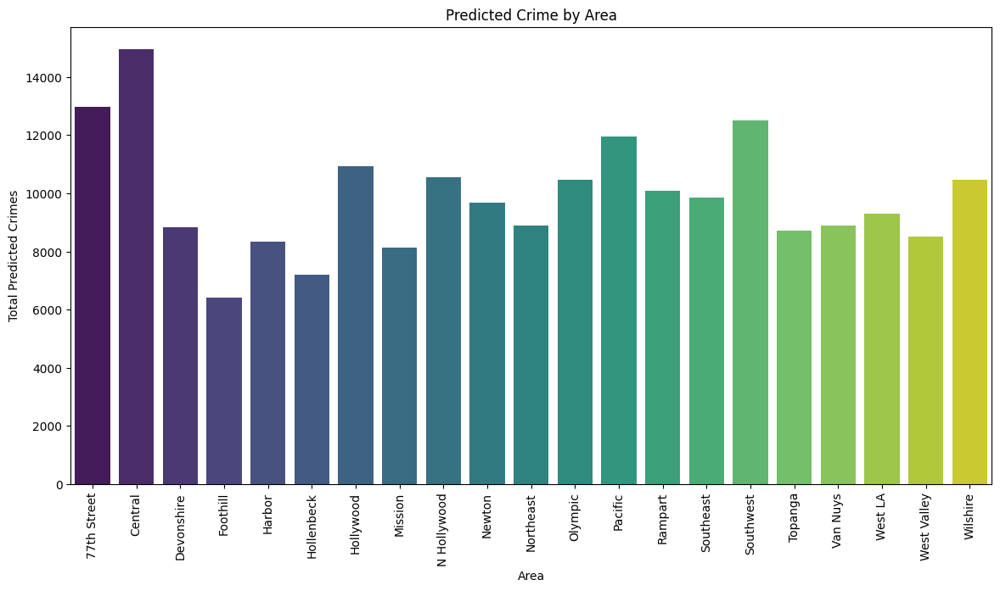

In [87]:
# Group the predictions by area and sum the predictions
predictions_by_area = predictions.groupby('Area')['Prediction'].sum().reset_index()

# Plot the data
plt.figure(figsize=(14, 7))
sns.barplot(x='Area', y='Prediction', data=predictions_by_area, palette='viridis')
plt.title('Predicted Crime by Area')
plt.xlabel('Area')
plt.ylabel('Total Predicted Crimes')
plt.xticks(rotation=90)
plt.show()

### Predictions by Month

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


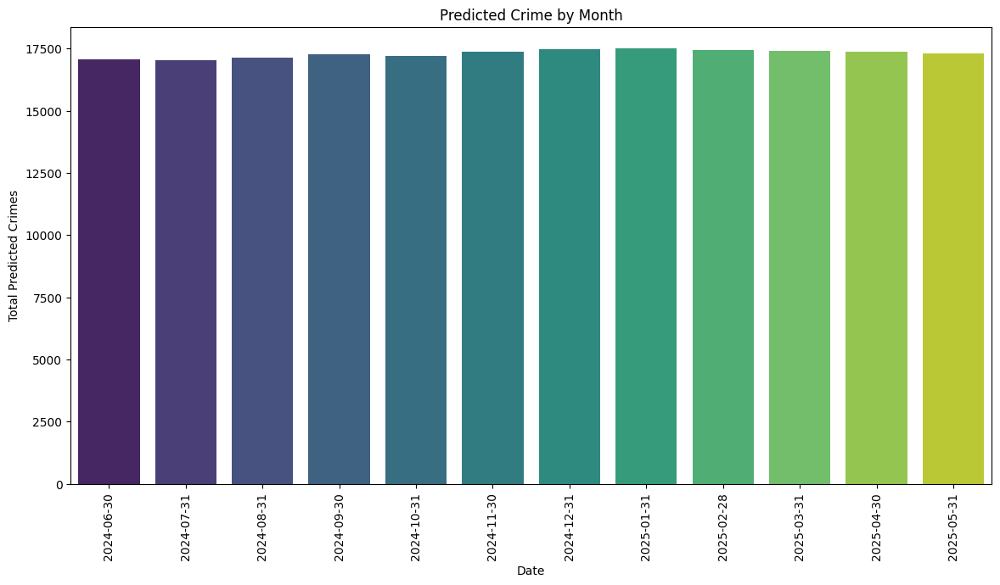

In [88]:
# Group the predictions by date and sum the predictions
predictions_by_date = predictions.groupby('Date')['Prediction'].sum().reset_index()

# Plot the data
plt.figure(figsize=(14, 7))
sns.barplot(x='Date', y='Prediction', data=predictions_by_date, palette='viridis')
plt.title('Predicted Crime by Month')
plt.xlabel('Date')
plt.ylabel('Total Predicted Crimes')
plt.xticks(rotation=90)
plt.show()

### Prediction by Area and Date

In [89]:
predictions_by_area_and_date = predictions.groupby(['Area', 'Date'])['Prediction'].sum().reset_index()
predictions_by_area_and_date.head()

,Area,Date,Prediction
0,77th Street,2024-06-30,1021
1,77th Street,2024-07-31,1039
2,77th Street,2024-08-31,1021
3,77th Street,2024-09-30,1078
4,77th Street,2024-10-31,1106


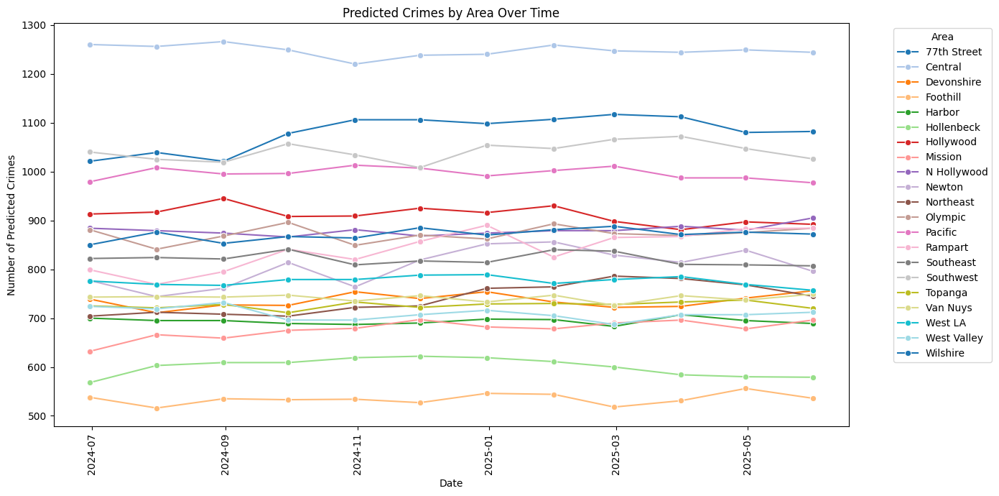

In [90]:
plt.figure(figsize=(14, 7))
sns.lineplot(data=predictions_by_area_and_date, x='Date', y='Prediction', hue='Area', palette='tab20', marker='o')
plt.title('Predicted Crimes by Area Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Predicted Crimes')
plt.xticks(rotation=90)
plt.legend(title='Area', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Conclusion

The analysis of the crime dataset has provided valuable insights into crime patterns and trends across different areas. By leveraging various data visualization techniques, we were able to identify the most common types of crimes, their distribution by area, and their trends over time. The clustering analysis revealed distinct crime clusters, which can help in understanding the spatial distribution of crimes. Additionally, the predictive modeling using the ForecasterAutoreg model has enabled us to forecast future crime occurrences, which can be instrumental for law enforcement agencies in planning and resource allocation. This comprehensive exploration underscores the importance of data-driven approaches in tackling crime and enhancing public safety.